In [1]:
from sklearn.feature_extraction.text import TfidfVectorizer
import requests
import nltk
import unicodedata
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
from acquire import scrape_github_data, headers

In [2]:
# Visit https://docs.github.com/en/rest/reference/search#search-repositories for more information on the different parameters
endpoint = "https://api.github.com/search/repositories"
query = "cryptocurrency"
sort = "stars"
per_page = 100
order = "desc"
page = 1
response = requests.get(f"{endpoint}?q={query}&sort={sort}&per_page={per_page}&order={order}&page={page}", headers=headers)
payload = response.json()
payload['items']

[{'id': 1181927,
  'node_id': 'MDEwOlJlcG9zaXRvcnkxMTgxOTI3',
  'name': 'bitcoin',
  'full_name': 'bitcoin/bitcoin',
  'private': False,
  'owner': {'login': 'bitcoin',
   'id': 528860,
   'node_id': 'MDEyOk9yZ2FuaXphdGlvbjUyODg2MA==',
   'avatar_url': 'https://avatars.githubusercontent.com/u/528860?v=4',
   'gravatar_id': '',
   'url': 'https://api.github.com/users/bitcoin',
   'html_url': 'https://github.com/bitcoin',
   'followers_url': 'https://api.github.com/users/bitcoin/followers',
   'following_url': 'https://api.github.com/users/bitcoin/following{/other_user}',
   'gists_url': 'https://api.github.com/users/bitcoin/gists{/gist_id}',
   'starred_url': 'https://api.github.com/users/bitcoin/starred{/owner}{/repo}',
   'subscriptions_url': 'https://api.github.com/users/bitcoin/subscriptions',
   'organizations_url': 'https://api.github.com/users/bitcoin/orgs',
   'repos_url': 'https://api.github.com/users/bitcoin/repos',
   'events_url': 'https://api.github.com/users/bitcoin/events

In [3]:
repo_list = [x['full_name'] for x in payload['items']]
repo_list

['bitcoin/bitcoin',
 'ccxt/ccxt',
 'freqtrade/freqtrade',
 'DeviaVir/zenbot',
 'lbryio/lbry-sdk',
 'monero-project/monero',
 'dvf/blockchain',
 'lightningnetwork/lnd',
 'mimblewimble/grin',
 'xmrig/xmrig',
 'tendermint/tendermint',
 'StockSharp/StockSharp',
 'edeng23/binance-trade-bot',
 'ripple/rippled',
 'input-output-hk/cardano-sl',
 'michaelgrosner/tribeca',
 'Scanate/EthList',
 'Zheaoli/awesome-coins',
 'RomelTorres/alpha_vantage',
 'itheima1/BlockChain',
 'coinpride/CryptoList',
 'status-im/status-react',
 'sammchardy/python-binance',
 'nanocurrency/nano-node',
 'lbryio/lbrycrd',
 'Jeiwan/blockchain_go',
 'ethereum/pyethereum',
 'bcoin-org/bcoin',
 'Xel/Blockchain-stuff',
 'cosmos/cosmos-sdk',
 'jesse-ai/jesse',
 'imfly/bitcoin-on-nodejs',
 'miguelmota/cointop',
 'ctubio/Krypto-trading-bot',
 'enigmampc/catalyst',
 'chrisleekr/binance-trading-bot',
 'liuchengxu/blockchain-tutorial',
 'thrasher-corp/gocryptotrader',
 'blockstack/stacks',
 'cazala/coin-hive',
 'spothq/cryptocurrenc

In [4]:
page = 2
response = requests.get(f"{endpoint}?q={query}&sort={sort}&per_page={per_page}&order={order}&page={page}", headers=headers)
payload = response.json()
payload['items']

[{'id': 119887944,
  'node_id': 'MDEwOlJlcG9zaXRvcnkxMTk4ODc5NDQ=',
  'name': 'peregrine',
  'full_name': 'wardbradt/peregrine',
  'private': False,
  'owner': {'login': 'wardbradt',
   'id': 26584797,
   'node_id': 'MDQ6VXNlcjI2NTg0Nzk3',
   'avatar_url': 'https://avatars.githubusercontent.com/u/26584797?v=4',
   'gravatar_id': '',
   'url': 'https://api.github.com/users/wardbradt',
   'html_url': 'https://github.com/wardbradt',
   'followers_url': 'https://api.github.com/users/wardbradt/followers',
   'following_url': 'https://api.github.com/users/wardbradt/following{/other_user}',
   'gists_url': 'https://api.github.com/users/wardbradt/gists{/gist_id}',
   'starred_url': 'https://api.github.com/users/wardbradt/starred{/owner}{/repo}',
   'subscriptions_url': 'https://api.github.com/users/wardbradt/subscriptions',
   'organizations_url': 'https://api.github.com/users/wardbradt/orgs',
   'repos_url': 'https://api.github.com/users/wardbradt/repos',
   'events_url': 'https://api.github.

In [5]:
repo_list2 = [x['full_name'] for x in payload['items']]
repo_list2

['wardbradt/peregrine',
 'bonesoul/CoiniumServ',
 'stellar/kelp',
 'nicehash/NiceHashQuickMiner',
 'ZENALC/algobot',
 'JerBouma/FinanceDatabase',
 'ericjang/cryptocurrency_arbitrage',
 'imbaniac/awesome-blockchain',
 'square/subzero',
 'ericsomdahl/python-bittrex',
 'decred/dcrd',
 'ryancdotorg/brainflayer',
 'BeamMW/beam',
 'beurtschipper/crackcoin',
 'cbailes/awesome-deep-trading',
 'ScottfreeLLC/AlphaPy',
 'status-im/status-go',
 'lightninglabs/neutrino',
 'lionsharecapital/lionshare-desktop',
 'xd4rker/MinerBlock',
 'veox/python3-krakenex',
 's4w3d0ff/python-poloniex',
 'pirate/crypto-trader',
 'skycoin/skycoin',
 'firoorg/firo',
 'gazbert/bxbot',
 'saniales/golang-crypto-trading-bot',
 'bmino/binance-triangle-arbitrage',
 'JulyIghor/QtBitcoinTrader',
 'hyperledger-labs/Scorex',
 'anfederico/gemini',
 'enzoampil/fastquant',
 'jjxtra/ExchangeSharp',
 'lucasjones/cpuminer-multi',
 'bitshares/bitshares-ui',
 'botupdate/botupdate',
 'stellar/js-stellar-sdk',
 'decred/atomicswap',
 'Asc

In [12]:
query = "dogecoin"
page = 1
response = requests.get(f"{endpoint}?q={query}&sort={sort}&per_page={per_page}&order={order}&page={page}", headers=headers)
payload = response.json()
repo_list3 = [x['full_name'] for x in payload['items']]
repo_list3

['dogecoin/dogecoin',
 'jdcloud-bds/bds',
 'cryptoapi/Payment-Gateway',
 'cryptean/bitcoinlib',
 'ranaroussi/pywallet',
 'goldennetwork/golden-wallet-react-native',
 'blockchain-etl/bitcoin-etl',
 'dogecoin/dogecoin.com',
 'limpbrains/django-cc',
 'cryptocoinjs/coinkey',
 'countable/node-dogecoin',
 'blockstrap/framework',
 'shphrd/crypto-icons',
 'rosetta-dogecoin/rosetta-dogecoin',
 'akx/walletool',
 'dogecoin/libdohj',
 'ebellocchia/bip_utils',
 'dogethereum/dogethereum-contracts',
 'cryptoapi/Bitcoin-Payment-Gateway-ASP.NET',
 'cryptoapi/Bitcoin-Wordpress-Plugin',
 'BlockIo/block_io-php',
 'kyo1337/dogeclickbot',
 'SoftblocksCo/Valets',
 'cryptoapi/Bitcoin-Payments-Woocommerce',
 'sanko/Finance-Robinhood',
 'jaimindp/Twitter_Activated_Crypto_Trading_Bot',
 'gschurck/tradoge',
 'AlexanderFSP/MultiCaptchaBot',
 'drjdaverth/doge_assets',
 'mniip/Doger',
 'dogethereum/docs',
 'BlockIo/multimerchant-python',
 'BlockIo/block_io-python',
 'darkengine-io/botcoin',
 'True-Mining/TrueMiningD

In [13]:
query = "ethereum"
page = 1
response = requests.get(f"{endpoint}?q={query}&sort={sort}&per_page={per_page}&order={order}&page={page}", headers=headers)
payload = response.json()
repo_list4 = [x['full_name'] for x in payload['items']]
repo_list4

['ethereum/go-ethereum',
 'ccxt/ccxt',
 'chaozh/awesome-blockchain-cn',
 'ethereum/wiki',
 'ChainSafe/web3.js',
 'OpenZeppelin/openzeppelin-contracts',
 'ethereum/solidity',
 'trufflesuite/truffle',
 'ethereumbook/ethereumbook',
 'ethereum/mist',
 'openethereum/parity-ethereum',
 'ethereum/EIPs',
 'yeasy/blockchain_guide',
 'ethereum-mining/ethminer',
 'aquynh/capstone',
 'MetaMask/metamask-extension',
 'ConsenSys/smart-contract-best-practices',
 'ConsenSys/quorum',
 'ethereum/aleth',
 'Scanate/EthList',
 'Zheaoli/awesome-coins',
 'embarklabs/embark',
 'coinpride/CryptoList',
 'SqueezerIO/squeezer',
 'trufflesuite/ganache-cli',
 'status-im/status-react',
 'web3j/web3j',
 'openblockchains/awesome-blockchains',
 'vyperlang/vyper',
 'CryptoSignal/Crypto-Signal',
 'golemfactory/clay',
 'trufflesuite/ganache',
 'Xel/Blockchain-stuff',
 'trailofbits/manticore',
 'ethers-io/ethers.js',
 'miguelmota/cointop',
 'ConsenSys/ethereum-developer-tools-list',
 'ethereum/ethereumj',
 'prysmaticlabs/pr

In [14]:
query = "bitcoin"
page = 1
response = requests.get(f"{endpoint}?q={query}&sort={sort}&per_page={per_page}&order={order}&page={page}", headers=headers)
payload = response.json()
repo_list5 = [x['full_name'] for x in payload['items']]
repo_list5

['bitcoin/bitcoin',
 'ccxt/ccxt',
 'HelloZeroNet/ZeroNet',
 'bitcoinbook/bitcoinbook',
 'askmike/gekko',
 'freqtrade/freqtrade',
 'bbfamily/abu',
 'lbryio/lbry-sdk',
 'dvf/blockchain',
 'yeasy/blockchain_guide',
 'butor/blackbird',
 'bitcoin/bips',
 'lightningnetwork/lnd',
 'spesmilo/electrum',
 'cjb/GitTorrent',
 'btcsuite/btcd',
 'bitcoinjs/bitcoinjs-lib',
 'StockSharp/StockSharp',
 'bitpay/bitcore',
 'bitcoinj/bitcoinj',
 'bisq-network/bisq',
 'michaelgrosner/tribeca',
 'Scanate/EthList',
 'Zheaoli/awesome-coins',
 'RomelTorres/alpha_vantage',
 'coinpride/CryptoList',
 'SqueezerIO/squeezer',
 'bitpay/wallet',
 'knowm/XChange',
 'lbryio/lbrycrd',
 'CryptoSignal/Crypto-Signal',
 'Jeiwan/blockchain_go',
 'lbryio/torba',
 'btcpayserver/btcpayserver',
 'bcoin-org/bcoin',
 'bitcoin-wallet/bitcoin-wallet',
 'Xel/Blockchain-stuff',
 'jesse-ai/jesse',
 'blockstack/stacks-blockchain',
 'imfly/bitcoin-on-nodejs',
 'pooler/cpuminer',
 'miguelmota/cointop',
 'ctubio/Krypto-trading-bot',
 'maxme/

In [2]:
scraped_list = scrape_github_data()
scraped_list

[{'repo': 'bitcoin/bitcoin',
  'language': 'C++',
  'readme_contents': "Bitcoin Core integration/staging tree\n=====================================\n\nhttps://bitcoincore.org\n\nFor an immediately usable, binary version of the Bitcoin Core software, see\nhttps://bitcoincore.org/en/download/.\n\nFurther information about Bitcoin Core is available in the [doc folder](/doc).\n\nWhat is Bitcoin?\n----------------\n\nBitcoin is an experimental digital currency that enables instant payments to\nanyone, anywhere in the world. Bitcoin uses peer-to-peer technology to operate\nwith no central authority: managing transactions and issuing money are carried\nout collectively by the network. Bitcoin Core is the name of open source\nsoftware which enables the use of this currency.\n\nFor more information read the original Bitcoin whitepaper.\n\nLicense\n-------\n\nBitcoin Core is released under the terms of the MIT license. See [COPYING](COPYING) for more\ninformation or see https://opensource.org/l

In [3]:
len(scraped_list)

500

In [4]:
df = pd.DataFrame(scraped_list)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   repo             500 non-null    object
 1   language         455 non-null    object
 2   readme_contents  500 non-null    object
dtypes: object(3)
memory usage: 11.8+ KB


In [16]:
df.language.value_counts()

Python              100
JavaScript           97
Go                   36
C++                  25
TypeScript           21
Java                 16
Rust                 14
C#                   13
PHP                  12
HTML                 11
C                     8
Ruby                  6
Swift                 5
CSS                   5
Jupyter Notebook      5
Shell                 4
TeX                   2
Vue                   2
Elixir                2
Scala                 2
Clojure               2
Perl                  2
Solidity              2
Vim script            1
Assembly              1
Common Lisp           1
VHDL                  1
QML                   1
Erlang                1
Lua                   1
Haskell               1
PowerShell            1
Dart                  1
Nim                   1
Name: language, dtype: int64

In [6]:
df.head()

,repo,language,readme_contents
0,bitcoin/bitcoin,C++,Bitcoin Core integration/staging tree\n=======...
1,ccxt/ccxt,JavaScript,# CCXT – CryptoCurrency eXchange Trading Libra...
2,freqtrade/freqtrade,Python,# ![freqtrade](https://raw.githubusercontent.c...
3,DeviaVir/zenbot,HTML,![zenbot logo](assets/logo.png)\n\n> “To follo...
4,lbryio/lbry-sdk,Python,"# <img src=""https://raw.githubusercontent.com/..."


In [7]:
df = df.drop_duplicates().dropna()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 403 entries, 0 to 494
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   repo             403 non-null    object
 1   language         403 non-null    object
 2   readme_contents  403 non-null    object
dtypes: object(3)
memory usage: 12.6+ KB


In [8]:
from prepare import basic_clean, lemmatize, remove_stopwords

[nltk_data] Downloading package stopwords to /Users/ken/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/ken/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [9]:
df = df.rename({'readme_contents':'original'},axis=1)
df['clean'] = df.original.apply(basic_clean)
df['lemmatized'] = df.clean.apply(lemmatize)
df['stopwords_removed'] = df.lemmatized.apply(remove_stopwords)
df.head()

,repo,language,original,clean,lemmatized,stopwords_removed
0,bitcoin/bitcoin,C++,Bitcoin Core integration/staging tree\n=======...,bitcoin core integrationstaging tree\n\n\nhttp...,bitcoin core integrationstaging tree httpsbitc...,bitcoin core integrationstaging tree httpsbitc...
1,ccxt/ccxt,JavaScript,# CCXT – CryptoCurrency eXchange Trading Libra...,ccxt cryptocurrency exchange trading library...,ccxt cryptocurrency exchange trading library b...,ccxt cryptocurrency exchange trading library b...
2,freqtrade/freqtrade,Python,# ![freqtrade](https://raw.githubusercontent.c...,freqtradehttpsrawgithubusercontentcomfreqtrad...,freqtradehttpsrawgithubusercontentcomfreqtrade...,freqtradehttpsrawgithubusercontentcomfreqtrade...
3,DeviaVir/zenbot,HTML,![zenbot logo](assets/logo.png)\n\n> “To follo...,zenbot logoassetslogopng\n\n to follow the pat...,zenbot logoassetslogopng to follow the path lo...,zenbot logoassetslogopng follow path look mast...
4,lbryio/lbry-sdk,Python,"# <img src=""https://raw.githubusercontent.com/...",img srchttpsrawgithubusercontentcomlbryiolbry...,img srchttpsrawgithubusercontentcomlbryiolbrys...,img srchttpsrawgithubusercontentcomlbryiolbrys...


In [10]:
all_words = ' '.join(df.stopwords_removed)
all_words

"bitcoin core integrationstaging tree httpsbitcoincoreorg immediately usable binary version bitcoin core software see httpsbitcoincoreorgendownload information bitcoin core available doc folderdoc bitcoin bitcoin experimental digital currency enables instant payment anyone anywhere world bitcoin us peertopeer technology operate central authority managing transaction issuing money carried collectively network bitcoin core name open source software enables use currency information read original bitcoin whitepaper license bitcoin core released term mit license see copyingcopying information see httpsopensourceorglicensesmit development process master branch regularly built see docbuildmd instruction tested guaranteed completely stable tagshttpsgithubcombitcoinbitcointags created regularly release branch indicate new official stable release version bitcoin core httpsgithubcombitcoincoregui repository used exclusively development gui master branch identical monotree repository release branc

In [11]:
all_words = pd.Series(all_words.split())
all_words.value_counts().head(20)

run            1349
td             1118
use            1100
install         989
1               983
wallet          875
data            841
file            840
transaction     823
build           803
version         757
using           742
address         726
key             715
api             710
bitcoin         699
new             674
see             670
code            668
make            651
dtype: int64

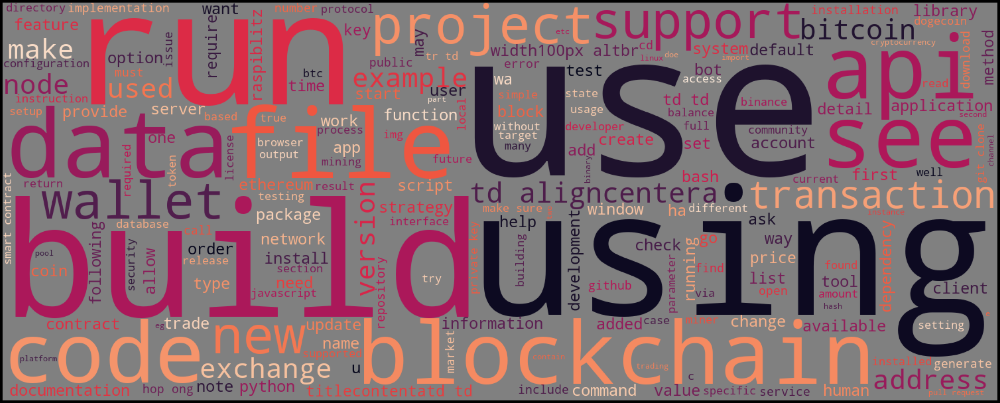

In [15]:
from wordcloud import WordCloud
all_cloud = WordCloud(background_color='grey', colormap='rocket', height=600, width=1500,random_state=123).generate(' '.join(all_words))
plt.figure(figsize=(100,20))
plt.axis('off')
plt.imshow(all_cloud)

In [19]:
top_30_crypto_bigrams = (pd.Series(nltk.ngrams(all_words, 2))
                      .value_counts()
                      .head(30))

top_30_crypto_bigrams

(td, aligncentera)       435
(width100px, altbr)      387
(td, td)                 304
(titlecontentatd, td)    189
(hop, ong)               178
(tr, td)                 157
(make, sure)             153
(git, clone)             144
(private, key)           139
(smart, contract)        134
(pull, request)          120
(npm, run)               111
(ff, ff)                 110
(npm, install)           107
(10003, 10003)           106
(pip, install)           103
(neural, network)         97
(public, key)             92
(tdtr, tr)                90
(api, key)                90
(targetblankrua, img)     88
(sudo, aptget)            81
(array, bid)              79
(united, state)           77
(docker, run)             76
(titlecodeatd, td)        73
(trading, strategy)       73
(create, new)             72
(command, line)           70
(source, code)            70
dtype: int64

In [22]:
crypto_bigrams = top_30_crypto_bigrams[6:]

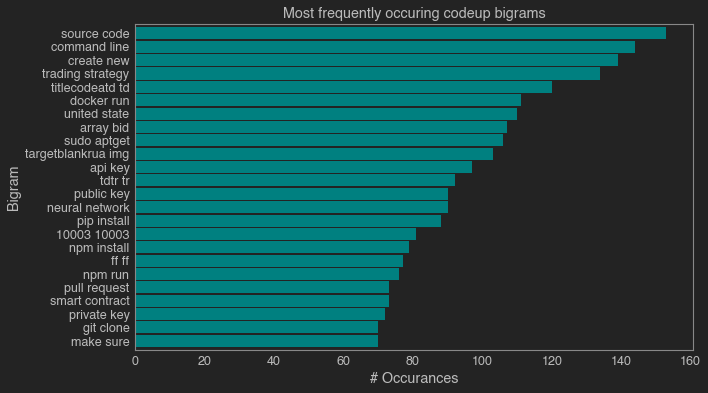

In [24]:
from jupyterthemes import jtplot
jtplot.style(grid=False)

crypto_bigrams.sort_values().plot.barh(color='teal', width=.9, figsize=(10, 6))

plt.title('Most frequently occuring codeup bigrams')
plt.ylabel('Bigram')
plt.xlabel('# Occurances')

# make the labels pretty
ticks, _ = plt.yticks()
labels = crypto_bigrams.reset_index()['index'].apply(lambda t: t[0] + ' ' + t[1])
_ = plt.yticks(ticks, labels)

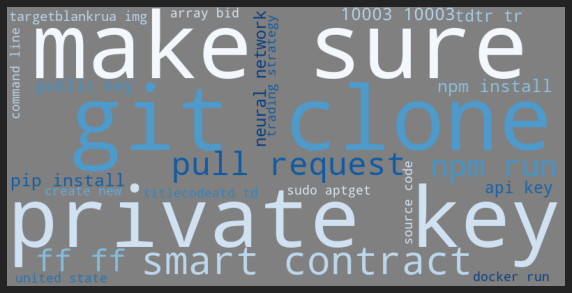

In [25]:
data = {k[0] + ' ' + k[1]: v for k, v in crypto_bigrams.to_dict().items()}
img = WordCloud(background_color='grey',colormap='Blues_r', width=800, height=400).generate_from_frequencies(data)
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.axis('off')
plt.show()